<a href="https://colab.research.google.com/github/esma-nur/Anomaly-Detection-Anomalib-Library/blob/main/MobileNet_withNewAugmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import zipfile
import cv2
from PIL import Image
from skimage import io
import tensorflow as tf
from tensorflow.python.keras import Sequential
from tensorflow.keras import layers, optimizers
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler
from IPython.display import display
from tensorflow.keras import backend as K
from sklearn.preprocessing import StandardScaler, normalize
import os
import glob
import random
%matplotlib inline

In [2]:
import tensorflow as tf
import os
import numpy as np
import glob
import random
import cv2
from tqdm import tqdm

from skimage.io import imread, imshow
from skimage.transform import resize
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Input, BatchNormalization,Conv2DTranspose, concatenate,Dense, Flatten, Conv2D, MaxPooling2D, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import regularizers
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from keras.preprocessing import image
from keras import backend as K

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
base_dir = "/content/drive/MyDrive/mvtec-wood/wood"
train_dir = os.path.join(base_dir, "train")
test_dir = os.path.join(base_dir, "test")
gt_dir = os.path.join(base_dir, "ground_truth")

data = []


train_good_dir = os.path.join(train_dir, "good")
if os.path.exists(train_good_dir):
    train_good_images = os.listdir(train_good_dir)
    for img_name in train_good_images:
        img_path = os.path.join(train_good_dir, img_name)
        mask_path = ""  # No mask for "good" category in train
        category = "good"
        mask = 0
        data.append([img_path, mask_path, category, mask])


test_good_dir = os.path.join(test_dir, "good")
if os.path.exists(test_good_dir):
    test_good_images = os.listdir(test_good_dir)
    for img_name in test_good_images:
        img_path = os.path.join(test_good_dir, img_name)
        mask_path = ""  # No mask for "good" category in test
        category = "good"
        mask = 0
        data.append([img_path, mask_path, category, mask])


gt_categories = ["color", "combined", "hole", "liquid", "scratch"]
for category in gt_categories:
    test_category_dir = os.path.join(test_dir, category)
    gt_category_dir = os.path.join(gt_dir, category)
    if os.path.exists(test_category_dir) and os.path.exists(gt_category_dir):
        test_images = os.listdir(test_category_dir)
        for img_name in test_images:
            img_path = os.path.join(test_category_dir, img_name)
            mask_name = img_name.split('.')[0] + "_mask.png"
            mask_path = os.path.join(gt_category_dir, mask_name)
            mask_category = category
            mask = 1
            data.append([img_path, mask_path, mask_category, mask])


# DataFrame
df = pd.DataFrame(data, columns=["image_path", "mask_path", "categories", "mask"])

print(df)

                                            image_path  \
0    /content/drive/MyDrive/mvtec-wood/wood/train/g...   
1    /content/drive/MyDrive/mvtec-wood/wood/train/g...   
2    /content/drive/MyDrive/mvtec-wood/wood/train/g...   
3    /content/drive/MyDrive/mvtec-wood/wood/train/g...   
4    /content/drive/MyDrive/mvtec-wood/wood/train/g...   
..                                                 ...   
321  /content/drive/MyDrive/mvtec-wood/wood/test/sc...   
322  /content/drive/MyDrive/mvtec-wood/wood/test/sc...   
323  /content/drive/MyDrive/mvtec-wood/wood/test/sc...   
324  /content/drive/MyDrive/mvtec-wood/wood/test/sc...   
325  /content/drive/MyDrive/mvtec-wood/wood/test/sc...   

                                             mask_path categories  mask  
0                                                            good     0  
1                                                            good     0  
2                                                            good     0  
3      

In [5]:
import pandas as pd
from PIL import Image
import numpy as np
import os


width, height = 1024, 1024


black_image_array = np.zeros((height, width, 3), dtype=np.uint8)
black_image = Image.fromarray(black_image_array)


save_directory = "/content/good-masks"


if not os.path.exists(save_directory):
    os.makedirs(save_directory)


df = pd.DataFrame(data, columns=["image_path", "mask_path", "categories", "mask"])


for index, row in df.iterrows():
    if pd.isnull(row['mask_path']) or row['mask_path'] == '':
        black_image_path = os.path.join(save_directory, f'black_image_{index}.png')
        black_image.save(black_image_path)
        df.at[index, 'mask_path'] = black_image_path

print("DataFrame after filling blank values in 'mask_path' column:")
print(df)


DataFrame after filling blank values in 'mask_path' column:
                                            image_path  \
0    /content/drive/MyDrive/mvtec-wood/wood/train/g...   
1    /content/drive/MyDrive/mvtec-wood/wood/train/g...   
2    /content/drive/MyDrive/mvtec-wood/wood/train/g...   
3    /content/drive/MyDrive/mvtec-wood/wood/train/g...   
4    /content/drive/MyDrive/mvtec-wood/wood/train/g...   
..                                                 ...   
321  /content/drive/MyDrive/mvtec-wood/wood/test/sc...   
322  /content/drive/MyDrive/mvtec-wood/wood/test/sc...   
323  /content/drive/MyDrive/mvtec-wood/wood/test/sc...   
324  /content/drive/MyDrive/mvtec-wood/wood/test/sc...   
325  /content/drive/MyDrive/mvtec-wood/wood/test/sc...   

                                             mask_path categories  mask  
0                /content/good-masks/black_image_0.png       good     0  
1                /content/good-masks/black_image_1.png       good     0  
2                /con

In [6]:
df.head()

,image_path,mask_path,categories,mask
0,/content/drive/MyDrive/mvtec-wood/wood/train/g...,/content/good-masks/black_image_0.png,good,0
1,/content/drive/MyDrive/mvtec-wood/wood/train/g...,/content/good-masks/black_image_1.png,good,0
2,/content/drive/MyDrive/mvtec-wood/wood/train/g...,/content/good-masks/black_image_2.png,good,0
3,/content/drive/MyDrive/mvtec-wood/wood/train/g...,/content/good-masks/black_image_3.png,good,0
4,/content/drive/MyDrive/mvtec-wood/wood/train/g...,/content/good-masks/black_image_4.png,good,0


In [7]:
df.shape

(326, 4)

In [9]:
df['categories'].value_counts()

categories
good        266
scratch      21
combined     11
hole         10
liquid       10
color         8
Name: count, dtype: int64

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 326 entries, 0 to 325
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  326 non-null    object
 1   mask_path   326 non-null    object
 2   categories  326 non-null    object
 3   mask        326 non-null    int64 
dtypes: int64(1), object(3)
memory usage: 10.3+ KB


In [11]:
df['mask'].value_counts()

mask
0    266
1     60
Name: count, dtype: int64

Data Augmentation

In [12]:
wood_df_mask = df[df['mask']==1]
wood_df_mask.shape

(60, 4)

In [13]:
wood_df_mask

,image_path,mask_path,categories,mask
266,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,color,1
267,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,color,1
268,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,color,1
269,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,color,1
270,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,color,1
271,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,color,1
272,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,color,1
273,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,color,1
274,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,combined,1
275,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,combined,1


In [14]:
from torchvision import transforms
import albumentations as A
from albumentations.pytorch import ToTensorV2
import torch
import os
import numpy as np
from PIL import Image


# Define the augmentation transformations
augmentations = A.Compose([
    A.RandomBrightnessContrast(p=0.3),
    A.HorizontalFlip(p=0.5),
    A.GaussNoise(p=0.3),
    A.ElasticTransform(p=0.5, alpha=120, sigma=120 * 0.05, alpha_affine=120 * 0.03),
    A.VerticalFlip(p=0.5),

    A.HueSaturationValue(p=0.4, hue_shift_limit=10, sat_shift_limit=30, val_shift_limit=20),
    A.Perspective(p=0.5),
    ToTensorV2(),
])


# Create directories to save augmented images and masks
output_image_dir = "/content/aug/image/"
output_mask_dir = "/content/aug/mask/"
os.makedirs(output_image_dir, exist_ok=True)
os.makedirs(output_mask_dir, exist_ok=True)


augmented_data = []


for index, row in wood_df_mask.iterrows():
    image_path = row['image_path']
    mask_path = row['mask_path']
    category = row['categories']


    wood_df_mask.at[index, 'mask'] = 1

    image = np.array(Image.open(image_path))
    mask = np.array(Image.open(mask_path))


    augmented_images = []
    augmented_masks = []

    for _ in range(5):
        augmented = augmentations(image=image, mask=mask)
        augmented_image = augmented['image']
        augmented_mask = augmented['mask']

        # Convert PyTorch tensor to NumPy array
        augmented_image = augmented_image.permute(1, 2, 0).cpu().numpy()

        # Ensure pixel values are in the range [0, 1] (undo normalization)
        augmented_image = augmented_image.astype(np.float32) / 255.0

        augmented_mask = augmented_mask.squeeze().cpu().numpy()
        augmented_mask[augmented_mask != 0] = 1
        augmented_mask = (augmented_mask * 255).astype(np.uint8)


        image_filename = f'{category}_{index}_aug_{_}.png'
        mask_filename = f'{category}_{index}_aug_mask_{_}.png'
        augmented_image_path = os.path.join(output_image_dir, image_filename)
        augmented_mask_path = os.path.join(output_mask_dir, mask_filename)

        Image.fromarray((augmented_image * 255).astype(np.uint8)).save(augmented_image_path)  # Convert back to uint8
        Image.fromarray(augmented_mask).save(augmented_mask_path)


        augmented_data.append([augmented_image_path, augmented_mask_path, category, 1])


np.random.shuffle(augmented_data)


augmented_df = pd.DataFrame(augmented_data, columns=['image_path', 'mask_path', 'category', 'mask'])



In [15]:
augmented_df = pd.DataFrame(augmented_data, columns=["image_path", "mask_path", "categories", "mask"])

concatenated_df = pd.concat([df, augmented_df], ignore_index=True)

concatenated_df.tail(5)

,image_path,mask_path,categories,mask
621,/content/aug/image/combined_275_aug_3.png,/content/aug/mask/combined_275_aug_mask_3.png,combined,1
622,/content/aug/image/combined_280_aug_1.png,/content/aug/mask/combined_280_aug_mask_1.png,combined,1
623,/content/aug/image/scratch_307_aug_2.png,/content/aug/mask/scratch_307_aug_mask_2.png,scratch,1
624,/content/aug/image/scratch_306_aug_4.png,/content/aug/mask/scratch_306_aug_mask_4.png,scratch,1
625,/content/aug/image/scratch_309_aug_4.png,/content/aug/mask/scratch_309_aug_mask_4.png,scratch,1


In [16]:
concatenated_df['mask'].value_counts()

mask
1    360
0    266
Name: count, dtype: int64

In [17]:
concatenated_df.isnull().sum()

image_path    0
mask_path     0
categories    0
mask          0
dtype: int64

In [18]:
# Before Data Augmentation
df['categories'].value_counts()

categories
good        266
scratch      21
combined     11
hole         10
liquid       10
color         8
Name: count, dtype: int64

In [19]:
# After Data Augmentation
concatenated_df['categories'].value_counts()


categories
good        266
scratch     126
combined     66
hole         60
liquid       60
color        48
Name: count, dtype: int64

PERFORM DATA VISUALIZATION

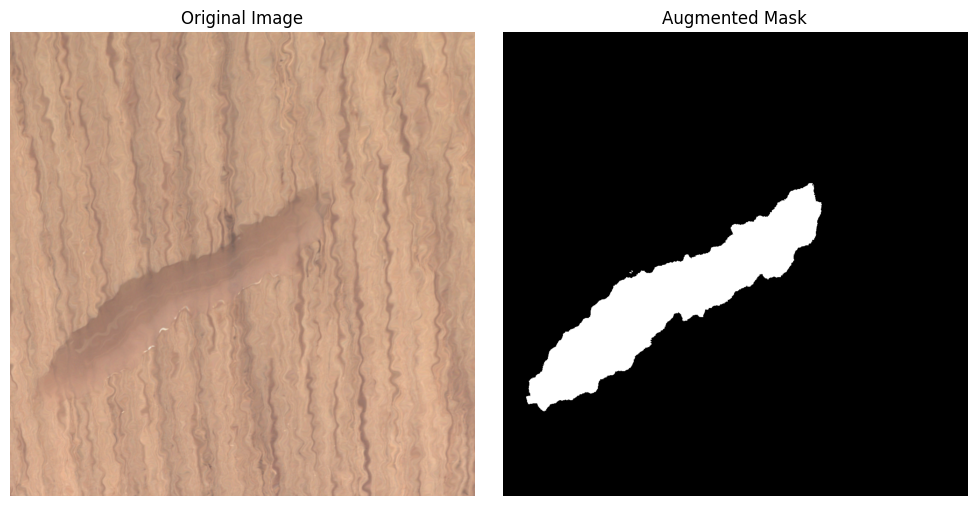

In [20]:
import matplotlib.pyplot as plt


index_to_visualize = 362


image_path = concatenated_df.loc[index_to_visualize, 'image_path']
mask_path = concatenated_df.loc[index_to_visualize, 'mask_path']


image = Image.open(image_path)
mask = Image.open(mask_path)

plt.figure(figsize=(10, 5))


plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(image)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Augmented Mask')
plt.imshow(mask, cmap='gray')  # Use 'gray' colormap for grayscale masks
plt.axis('off')


plt.tight_layout()
plt.show()

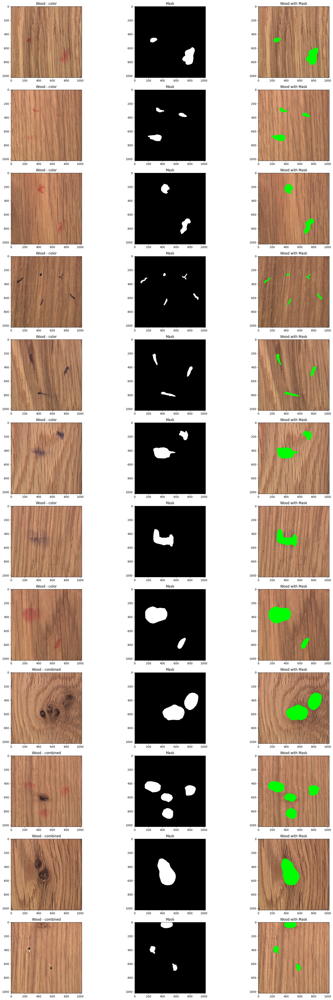

In [21]:
count = 0
fig, axs = plt.subplots(12, 3, figsize = (20, 50))
for i in range(len(df)):
  if concatenated_df['mask'][i] ==1 and count <12:
    img = io.imread(concatenated_df.image_path[i])
    axs[count][0].title.set_text("Wood - " + str(concatenated_df['categories'][i]))
    axs[count][0].imshow(img)

    mask = io.imread(concatenated_df.mask_path[i])
    axs[count][1].title.set_text('Mask')
    axs[count][1].imshow(mask, cmap = 'gray')


    img[mask == 255] = (0, 255, 0)
    axs[count][2].title.set_text('Wood with Mask')
    axs[count][2].imshow(img)
    count+=1

fig.tight_layout()

TRAIN A CLASSIFIER MODEL TO DETECT IF DEFECTED OR NOT

In [22]:
df_train = concatenated_df
df_train.shape

(626, 4)

In [23]:
df_train['mask'] = df_train['mask'].apply(lambda x: str(x))

In [24]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 626 entries, 0 to 625
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  626 non-null    object
 1   mask_path   626 non-null    object
 2   categories  626 non-null    object
 3   mask        626 non-null    object
dtypes: object(4)
memory usage: 19.7+ KB


In [25]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(df_train, test_size = 0.2)

In [26]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Create a data generator which scales the data from 0 to 1 and makes a validation split of 0.2
datagen = ImageDataGenerator(
    rescale=1./255.,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    validation_split=0.2
)


In [52]:
train_generator=datagen.flow_from_dataframe(
dataframe=train,
directory= './',
x_col='image_path',
y_col='mask',
subset="training",
batch_size=16,
shuffle=True,
class_mode="categorical",
target_size=(224,224))


valid_generator=datagen.flow_from_dataframe(
dataframe=train,
directory= './',
x_col='image_path',
y_col='mask',
subset="validation",
batch_size=16,
shuffle=True,
class_mode="categorical",
target_size=(224,224))

# Create a data generator for test images
test_datagen=ImageDataGenerator(rescale=1./255.)

test_generator=test_datagen.flow_from_dataframe(
dataframe=test,
directory= './',
x_col='image_path',
y_col='mask',
batch_size=16,
shuffle=False,
class_mode='categorical',
target_size=(224,224))


Found 400 validated image filenames belonging to 2 classes.
Found 100 validated image filenames belonging to 2 classes.
Found 126 validated image filenames belonging to 2 classes.


In [53]:
from keras.applications import MobileNet

basemodel = MobileNet(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

17225924/17225924 [==============================] - 0s 0us/step


In [54]:
basemodel.summary()

Model: "mobilenet_1.00_224"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 32)      864       
                                                                 
 conv1_bn (BatchNormalizati  (None, 112, 112, 32)      128       
 on)                                                             
                                                                 
 conv1_relu (ReLU)           (None, 112, 112, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D  (None, 112, 112, 32)      288       
 )                                                               
                                                                 
 conv_dw_1_bn (BatchNormali  (None, 112, 112, 32

In [56]:
headmodel = basemodel.output
headmodel = GlobalAveragePooling2D()(headmodel)
headmodel = Dense(128, activation='relu')(headmodel)
headmodel = Dropout(0.3)(headmodel)
output_layer = Dense(2, activation='softmax')(headmodel)
model = Model(inputs=basemodel.input, outputs=output_layer)

In [55]:
for layer in model.layers:
  layers.trainable = False

In [57]:
model.compile(loss = 'categorical_crossentropy', optimizer='adam', metrics= ["accuracy"])

In [59]:
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=7)

checkpoint_path = '/content/classifier-MobileNet19-weights.hdf5'

checkpointer = ModelCheckpoint(filepath=checkpoint_path, verbose=1, save_best_only=True)

history = model.fit(train_generator, steps_per_epoch=train_generator.n // 16, epochs=15, validation_data=valid_generator, validation_steps=valid_generator.n // 16, callbacks=[checkpointer, earlystopping])

Epoch 1/15
25/25 [==============================] - ETA: 0s - loss: 0.3646 - accuracy: 0.8825
Epoch 1: val_loss improved from inf to 1.11333, saving model to /content/classifier-MobileNet19-weights.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


25/25 [==============================] - 28s 1s/step - loss: 0.3646 - accuracy: 0.8825 - val_loss: 1.1133 - val_accuracy: 0.6771
Epoch 2/15
25/25 [==============================] - ETA: 0s - loss: 0.1424 - accuracy: 0.9475
Epoch 2: val_loss improved from 1.11333 to 0.45663, saving model to /content/classifier-MobileNet19-weights.hdf5
25/25 [==============================] - 27s 1s/step - loss: 0.1424 - accuracy: 0.9475 - val_loss: 0.4566 - val_accuracy: 0.8542
Epoch 3/15
25/25 [==============================] - ETA: 0s - loss: 0.0487 - accuracy: 0.9750
Epoch 3: val_loss did not improve from 0.45663
25/25 [==============================] - 27s 1s/step - loss: 0.0487 - accuracy: 0.9750 - val_loss: 0.7187 - val_accuracy: 0.9062
Epoch 4/15
25/25 [==============================] - ETA: 0s - loss: 0.0597 - accuracy: 0.9800
Epoch 4: val_loss did not improve from 0.45663
25/25 [==============================] - 27s 1s/step - loss: 0.0597 - accuracy: 0.9800 - val_loss: 0.6168 - val_accuracy: 0.

In [60]:
model_json = model.to_json()
with open("classifier-MobileNet-model.json","w") as json_file:
  json_file.write(model_json)

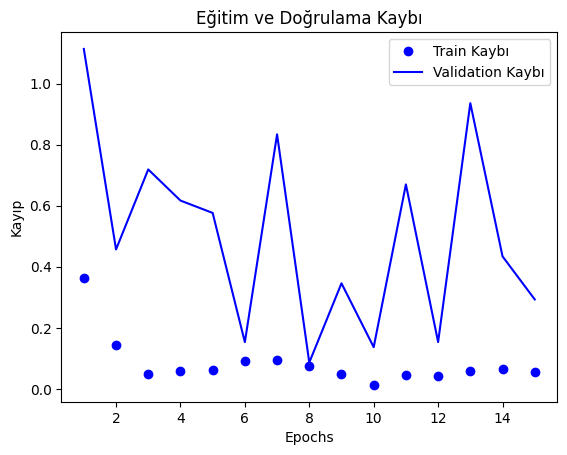

In [61]:
import matplotlib.pyplot as plt

# Eğitim kaybı ve doğruluk değerlerini al
loss = history.history['loss']
val_loss = history.history['val_loss']

# Her epoch için numaraları al
epochs = range(1, len(loss) + 1)

# Eğitim ve doğruluk kaybını çiz
plt.plot(epochs, loss, 'bo', label='Train Kaybı')
plt.plot(epochs, val_loss, 'b', label='Validation Kaybı')
plt.title('Eğitim ve Doğrulama Kaybı')
plt.xlabel('Epochs')
plt.ylabel('Kayıp')
plt.legend()

plt.show()


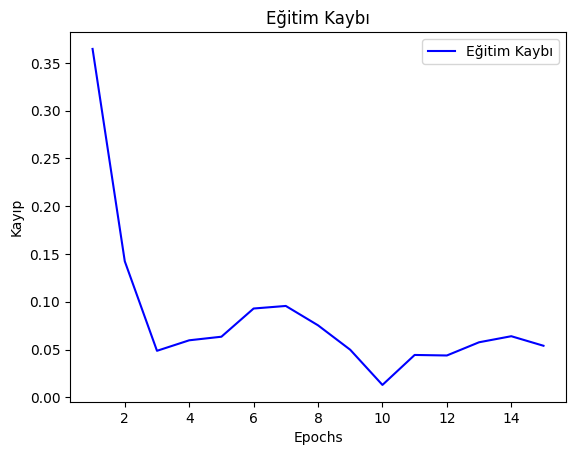

In [62]:
import matplotlib.pyplot as plt

# Eğitim kaybı ve doğruluk değerlerini al
loss = history.history['loss']

# Her epoch için numaraları al
epochs = range(1, len(loss) + 1)

# Eğitim ve doğruluk kaybını çiz
plt.plot(epochs, loss, 'b', label='Eğitim Kaybı')
plt.title('Eğitim Kaybı')
plt.xlabel('Epochs')
plt.ylabel('Kayıp')
plt.legend()

plt.show()

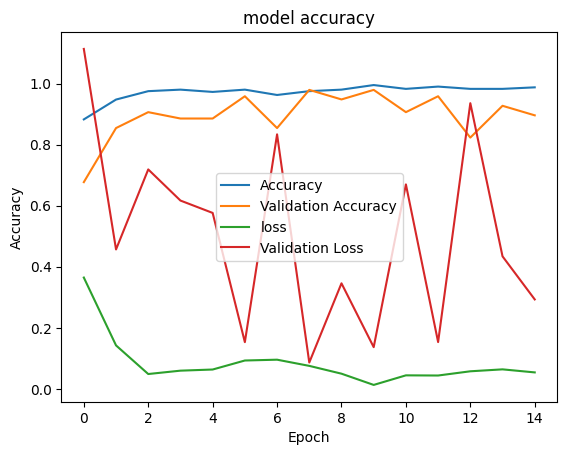

In [66]:
import matplotlib.pyplot as plt
plt.plot(history.history["accuracy"])
plt.plot(history.history['val_accuracy'])
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title("model accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["Accuracy","Validation Accuracy","loss","Validation Loss"])
plt.show()

ASSESS TRAINED MODEL PERFORMANCE

In [64]:
# prediction
test_predict = model.predict(test_generator, steps = test_generator.n // 16, verbose =1)

7/7 [==============================] - 17s 3s/step


In [65]:
test_predict.shape

(112, 2)

In [67]:
predict = []

for i in test_predict:
  predict.append(str(np.argmax(i)))

predict = np.asarray(predict)

In [68]:
predict

array(['0', '0', '1', '0', '1', '0', '1', '1', '0', '1', '1', '1', '1',
       '0', '0', '0', '1', '1', '1', '1', '1', '1', '1', '0', '0', '1',
       '1', '0', '0', '0', '1', '1', '1', '0', '0', '0', '1', '0', '0',
       '1', '0', '1', '0', '0', '1', '1', '1', '0', '0', '1', '0', '1',
       '1', '1', '0', '1', '0', '0', '0', '0', '0', '1', '1', '0', '1',
       '1', '0', '0', '1', '1', '0', '1', '0', '1', '0', '1', '1', '1',
       '0', '1', '1', '0', '1', '1', '0', '0', '1', '1', '1', '1', '1',
       '1', '0', '0', '0', '1', '1', '1', '0', '1', '0', '0', '0', '0',
       '1', '1', '0', '0', '1', '1', '0', '1'], dtype='<U1')

In [69]:
original = np.asarray(test['mask'])[:len(predict)]
len(original)

112

In [70]:
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(original, predict)
accuracy

0.9910714285714286

<Axes: >

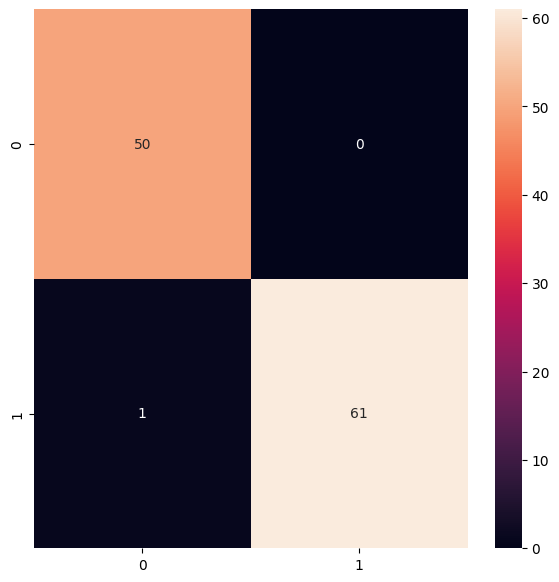

In [71]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(original, predict)
plt.figure(figsize = (7,7))
sns.heatmap(cm, annot=True)

In [72]:
from sklearn.metrics import classification_report

report = classification_report(original, predict, labels = [0,1])
print(report)

              precision    recall  f1-score   support

           0       0.98      1.00      0.99        50
           1       1.00      0.98      0.99        62

   micro avg       0.99      0.99      0.99       112
   macro avg       0.99      0.99      0.99       112
weighted avg       0.99      0.99      0.99       112



BUILD A SEGMENTATION MODEL TO LOCALIZE THE DEFECTION

In [73]:
concatenated_df['mask'] = concatenated_df['mask'].apply(lambda x: int(x))

In [74]:
wood_df_mask = concatenated_df[concatenated_df['mask']==1]
wood_df_mask.shape

(360, 4)

In [75]:
wood_df_mask

,image_path,mask_path,categories,mask
266,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,color,1
267,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,color,1
268,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,color,1
269,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,color,1
270,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,color,1
...,...,...,...,...
621,/content/aug/image/combined_275_aug_3.png,/content/aug/mask/combined_275_aug_mask_3.png,combined,1
622,/content/aug/image/combined_280_aug_1.png,/content/aug/mask/combined_280_aug_mask_1.png,combined,1
623,/content/aug/image/scratch_307_aug_2.png,/content/aug/mask/scratch_307_aug_mask_2.png,scratch,1
624,/content/aug/image/scratch_306_aug_4.png,/content/aug/mask/scratch_306_aug_mask_4.png,scratch,1


In [76]:
from sklearn.model_selection import train_test_split

X_train, X_val = train_test_split(wood_df_mask, test_size=0.2)
X_test, X_val = train_test_split(X_val, test_size=0.5)

In [77]:
train_ids = list(X_train.image_path)
train_mask = list(X_train.mask_path)

val_ids = list(X_val.image_path)
val_mask= list(X_val.mask_path)

In [78]:
class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, ids, mask, image_dir='./', batch_size=16, img_h=224, img_w=224, shuffle=True):
        self.ids = ids
        self.mask = mask
        self.image_dir = image_dir
        self.batch_size = batch_size
        self.img_h = img_h
        self.img_w = img_w
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        return int(np.floor(len(self.ids)) / self.batch_size)

    def __getitem__(self, index):
        indexes = self.indexes[index * self.batch_size: (index + 1) * self.batch_size]
        list_ids = [self.ids[i] for i in indexes]
        list_mask = [self.mask[i] for i in indexes]
        X, y = self.__data_generation(list_ids, list_mask)
        return X, y

    def on_epoch_end(self):
        self.indexes = np.arange(len(self.ids))
        if self.shuffle:
            np.random.shuffle(self.indexes)

    def __data_generation(self, list_ids, list_mask):
        X = np.empty((self.batch_size, self.img_h, self.img_w, 3))
        y = np.empty((self.batch_size, self.img_h, self.img_w, 1))

        for i in range(len(list_ids)):
            img_path = list_ids[i]
            mask_path = list_mask[i]
            img = io.imread(img_path)
            mask = io.imread(mask_path)
            img = cv2.resize(img, (self.img_h, self.img_w))
            img = np.array(img, dtype=np.float64)
            mask = cv2.resize(mask, (self.img_h, self.img_w))
            mask = np.array(mask, dtype=np.float64)

            img -= img.mean()
            img /= img.std()
            mask -= mask.mean()
            mask /= mask.std()

            X[i,] = img
            y[i,] = np.expand_dims(mask, axis=2)

        y = (y > 0).astype(int)

        return X, y

In [79]:
def prediction(test, model, model_seg):
    directory = "./"
    mask = []
    image_id = []
    has_mask = []

    for i in test.image_path:
        path = i
        img = io.imread(path)
        img = img * 1.0 / 255.
        img = cv2.resize(img, (224, 224))
        img = np.array(img, dtype=np.float64)
        img = np.reshape(img, (1, 224,224, 3))
        is_defect = model.predict(img)

        if np.argmax(is_defect) == 0:
            image_id.append(i)
            has_mask.append(0)
            mask.append('No mask')
            continue

        img = io.imread(path)
        X = np.empty((1, 224,224, 3))
        img = cv2.resize(img, (224,224))
        img = np.array(img, dtype=np.float64)
        img -= img.mean()
        img /= img.std()
        X[0,] = img
        predict = model_seg.predict(X)

        if predict.round().astype(int).sum() == 0:
            image_id.append(i)
            has_mask.append(0)
            mask.append('No mask')
        else:
            image_id.append(i)
            has_mask.append(1)
            mask.append(predict)

    return image_id, mask, has_mask

In [80]:

def tversky(y_true, y_pred):
    smooth = 1.0  # Use a float value for smooth
    y_true_pos = K.flatten(K.cast(y_true, 'float32'))
    y_pred_pos = K.flatten(K.cast(y_pred, 'float32'))
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1 - y_pred_pos))
    false_pos = K.sum((1 - y_true_pos) * y_pred_pos)
    alpha = 0.7
    return (true_pos + smooth) / (true_pos + alpha * false_neg + (1 - alpha) * false_pos + smooth)

def tversky_loss(y_true, y_pred):
    return 1 - tversky(y_true,y_pred)

def focal_tversky(y_true,y_pred):
    pt_1 = tversky(y_true, y_pred)
    gamma = 0.75
    return K.pow((1-pt_1), gamma)


#custom loss and metrics functions
def iou(y_true, y_pred, smooth=1):
    intersection = K.sum(K.abs(y_true * y_pred), axis=(1, 2))
    union = K.sum(y_true, axis=(1, 2)) + K.sum(y_pred, axis=(1, 2)) - intersection
    iou = K.mean((intersection + smooth) / (union + smooth), axis=0)
    return iou

def F1(y_true, y_pred, smooth=1):
    intersection = K.sum(y_true * y_pred, axis=(1, 2))
    precision = (intersection + smooth) / (K.sum(y_pred, axis=(1, 2)) + smooth)
    recall = (intersection + smooth) / (K.sum(y_true, axis=(1, 2)) + smooth)
    f1 = 2 * (precision * recall) / (precision + recall)
    return K.mean(f1)

def recall(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def dice_coef(y_true, y_pred, smooth = 0.00001):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)


def dice_coef_loss(y_true, y_pred):
    return -dice_coef(y_true, y_pred)


In [81]:
training_generator = DataGenerator(train_ids,train_mask)
validation_generator = DataGenerator(val_ids,val_mask)

In [82]:
def resblock(X, f):

  X_copy = X
  X = Conv2D(f, kernel_size = (1,1) ,strides = (1,1),kernel_initializer ='he_normal')(X)
  X = BatchNormalization()(X)
  X = Activation('relu')(X)

  X = Conv2D(f, kernel_size = (3,3), strides =(1,1), padding = 'same', kernel_initializer ='he_normal')(X)
  X = BatchNormalization()(X)

  X_copy = Conv2D(f, kernel_size = (1,1), strides =(1,1), kernel_initializer ='he_normal')(X_copy)
  X_copy = BatchNormalization()(X_copy)


  X = Add()([X,X_copy])
  X = Activation('relu')(X)

  return X

In [83]:
def upsample_concat(x, skip):
  x = UpSampling2D((2,2))(x)
  merge = Concatenate()([x, skip])

  return merge

In [84]:
input_shape = (224,224,3)

X_input = Input(input_shape)

# Stage 1
conv1_in = Conv2D(64,3,activation= 'relu', padding = 'same', kernel_initializer ='he_normal')(X_input)
conv1_in = BatchNormalization()(conv1_in)
conv1_in = Conv2D(64,3,activation= 'relu', padding = 'same', kernel_initializer ='he_normal')(conv1_in)
conv1_in = BatchNormalization()(conv1_in)
pool_1 = MaxPool2D(pool_size = (2,2))(conv1_in)

# Stage 2
conv2_in = resblock(pool_1, 128)
pool_2 = MaxPool2D(pool_size = (2,2))(conv2_in)

# Stage 3
conv3_in = resblock(pool_2, 256)
pool_3 = MaxPool2D(pool_size = (2,2))(conv3_in)

# Stage 4
conv4_in = resblock(pool_3, 512)
pool_4 = MaxPool2D(pool_size = (2,2))(conv4_in)

# Stage 5 (Bottle Neck)
conv5_in = resblock(pool_4, 1024)

# Upscale stage 1
up_1 = upsample_concat(conv5_in, conv4_in)
up_1 = resblock(up_1, 512)

# Upscale stage 2
up_2 = upsample_concat(up_1, conv3_in)
up_2 = resblock(up_2, 256)

# Upscale stage 3
up_3 = upsample_concat(up_2, conv2_in)
up_3 = resblock(up_3, 128)

# Upscale stage 4
up_4 = upsample_concat(up_3, conv1_in)
up_4 = resblock(up_4, 64)

# Final Output
output = Conv2D(1, (1,1), padding = "same", activation = "sigmoid")(up_4)

model_seg = Model(inputs = X_input, outputs = output )

In [85]:
model_seg.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d_10 (Conv2D)          (None, 224, 224, 64)         1792      ['input_3[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 224, 224, 64)         256       ['conv2d_10[0][0]']           
 Normalization)                                                                                   
                                                                                                  
 conv2d_11 (Conv2D)          (None, 224, 224, 64)         36928     ['batch_normalization[0]

TRAIN A SEGMENTATION RESUNET MODEL TO LOCALIZE DEFECTION

In [86]:
from tensorflow import keras
# Compile the model
optimizer = keras.optimizers.Adam(learning_rate=0.001)
model_seg.compile(optimizer=optimizer, loss=focal_tversky, metrics=[tversky])

In [87]:
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
checkpointer = ModelCheckpoint(filepath="mobileNet-weights.hdf5", verbose=1, save_best_only=True)

In [90]:
history = model_seg.fit(training_generator, epochs = 100, validation_data = validation_generator, callbacks = [checkpointer, earlystopping])

Epoch 1/100
18/18 [==============================] - ETA: 0s - loss: 0.6233 - tversky: 0.4620
Epoch 1: val_loss improved from inf to 0.88762, saving model to mobileNet-weights.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


18/18 [==============================] - 35s 928ms/step - loss: 0.6233 - tversky: 0.4620 - val_loss: 0.8876 - val_tversky: 0.1468
Epoch 2/100
18/18 [==============================] - ETA: 0s - loss: 0.4447 - tversky: 0.6571
Epoch 2: val_loss did not improve from 0.88762
18/18 [==============================] - 16s 906ms/step - loss: 0.4447 - tversky: 0.6571 - val_loss: 0.8968 - val_tversky: 0.1351
Epoch 3/100
18/18 [==============================] - ETA: 0s - loss: 0.3633 - tversky: 0.7383
Epoch 3: val_loss did not improve from 0.88762
18/18 [==============================] - 16s 906ms/step - loss: 0.3633 - tversky: 0.7383 - val_loss: 0.8899 - val_tversky: 0.1440
Epoch 4/100
18/18 [==============================] - ETA: 0s - loss: 0.3433 - tversky: 0.7582
Epoch 4: val_loss did not improve from 0.88762
18/18 [==============================] - 16s 905ms/step - loss: 0.3433 - tversky: 0.7582 - val_loss: 0.8949 - val_tversky: 0.1375
Epoch 5/100
18/18 [==============================] - ETA:

In [91]:
model_json = model_seg.to_json()
with open("mobileNet-model.json","w") as json_file:
  json_file.write(model_json)

In [92]:
image_id, mask, has_mask = prediction(test, model, model_seg)

1/1 [==============================] - 0s 22ms/step


ASSESS TRAINED SEGMENTATION RESUNET MODEL PERFORMANCE

In [93]:
df_pred = pd.DataFrame({'image_path': image_id,'predicted_mask': mask,'has_mask': has_mask})
df_pred

,image_path,predicted_mask,has_mask
0,/content/drive/MyDrive/mvtec-wood/wood/train/g...,No mask,0
1,/content/drive/MyDrive/mvtec-wood/wood/train/g...,No mask,0
2,/content/drive/MyDrive/mvtec-wood/wood/test/sc...,"[[[[7.151149e-05], [4.3024716e-05], [1.3427964...",1
3,/content/drive/MyDrive/mvtec-wood/wood/train/g...,No mask,0
4,/content/drive/MyDrive/mvtec-wood/wood/test/co...,"[[[[0.00019981], [4.430578e-05], [2.62851e-05]...",1
...,...,...,...
121,/content/drive/MyDrive/mvtec-wood/wood/test/co...,"[[[[6.0733186e-05], [8.090896e-06], [5.6447184...",1
122,/content/drive/MyDrive/mvtec-wood/wood/train/g...,No mask,0
123,/content/drive/MyDrive/mvtec-wood/wood/train/g...,No mask,0
124,/content/drive/MyDrive/mvtec-wood/wood/test/co...,"[[[[8.267081e-05], [8.2637074e-05], [2.8645529...",1


In [94]:
df_pred = test.merge(df_pred, on = 'image_path')

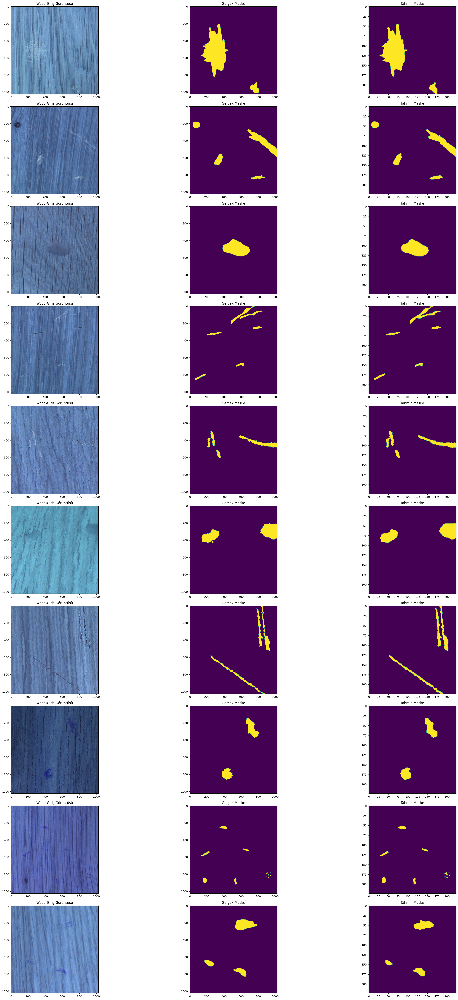

In [95]:
count = 0
fig, axs = plt.subplots(10, 3, figsize=(30, 50))
for i in range(len(df_pred)):
  if df_pred['has_mask'][i] == 1 and count < 10:

    img = io.imread(df_pred.image_path[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axs[count][0].title.set_text("Wood-Giriş Görüntüsü")
    axs[count][0].imshow(img)


    mask = io.imread(df_pred.mask_path[i])
    axs[count][1].title.set_text("Gerçek Maske")
    axs[count][1].imshow(mask)


    predicted_mask = np.asarray(df_pred.predicted_mask[i])[0].squeeze().round()
    axs[count][2].title.set_text("Tahmin Maske")
    axs[count][2].imshow(predicted_mask)
    count += 1

fig.tight_layout()

In [96]:
import cv2
import os
import random

# Kaynak ve hedef klasörler
source_folder = "output_images"
output_folder = "output_images"

# Hedef klasörü oluştur
os.makedirs(output_folder, exist_ok=True)

# Klasördeki dosya listesini al
image_files = [f for f in os.listdir(source_folder) if f.endswith(".png")]

# Eğer toplam dosya sayısı 20'den azsa, tüm dosyaları kullan
if len(image_files) <= 20:
    selected_files = image_files
else:
    # Eğer toplam dosya sayısı 20'den fazlaysa, rastgele 20 dosya seç
    selected_files = random.sample(image_files, 20)

# Seçilen dosyalar üzerinde döngü
for filename in selected_files:
    # Görüntüyü oku
    image_path = os.path.join(source_folder, filename)
    img = cv2.imread(image_path)

    # Görüntüyü 480x480 boyutunda kırp
    h, w = img.shape[:2]
    center_h, center_w = h // 2, w // 2
    cropped_img = img[center_h - 240:center_h + 240, center_w - 240:center_w + 240]

    # Görüntüyü kaydet
    output_path = os.path.join(output_folder, filename)
    cv2.imwrite(output_path, cropped_img)

print(f"Rastgele seçilen 20 görüntü {output_folder} klasörüne 480x480 olarak kırpılarak kaydedildi.")


Rastgele seçilen 20 görüntü output_images klasörüne 480x480 olarak kırpılarak kaydedildi.


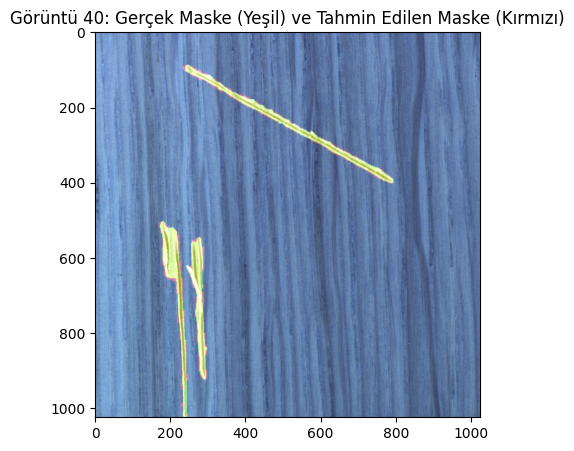

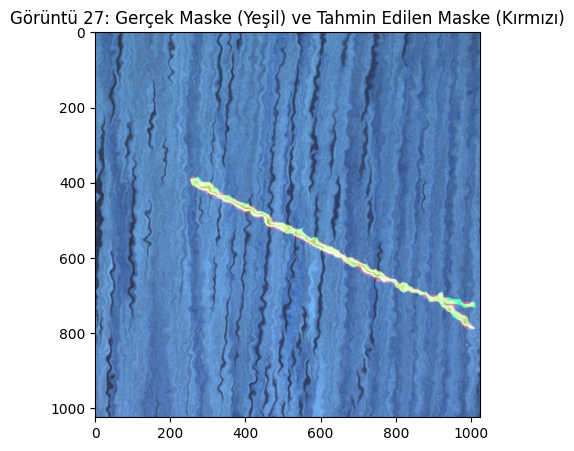

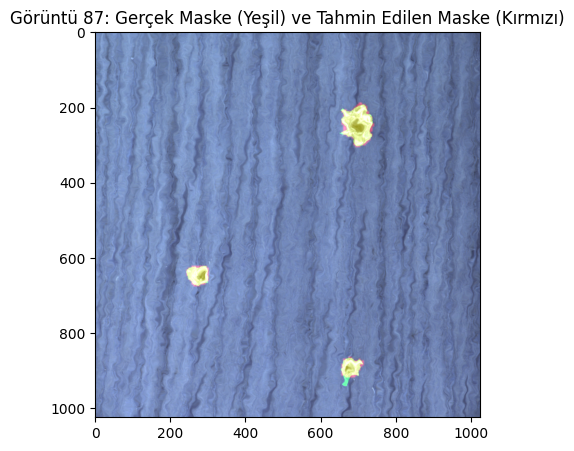

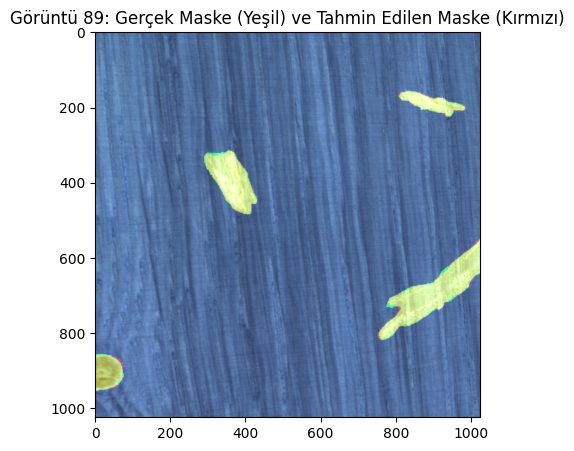

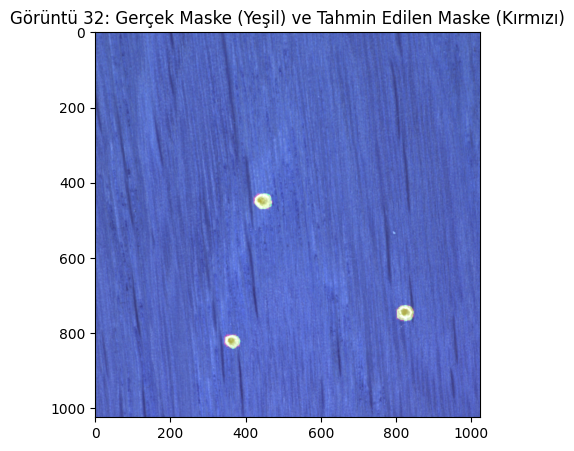

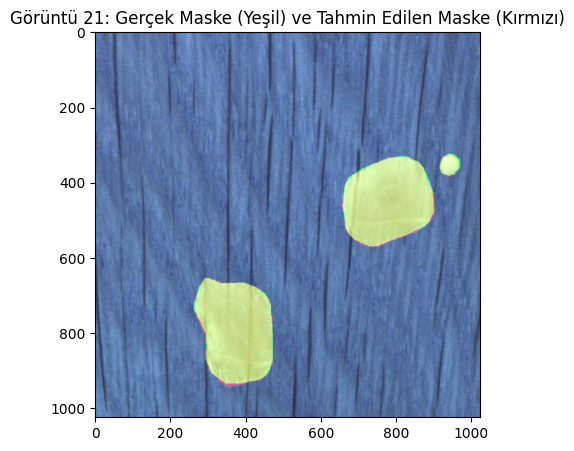

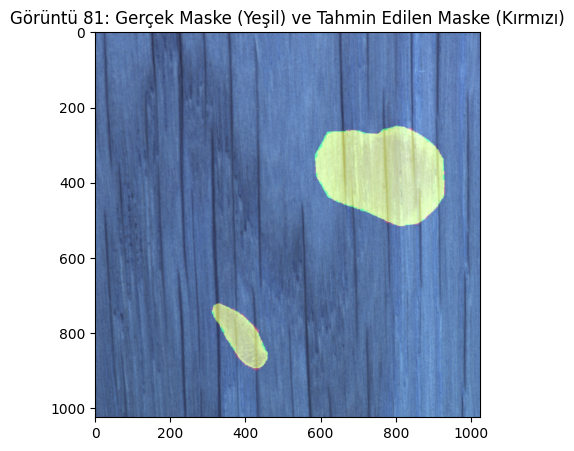

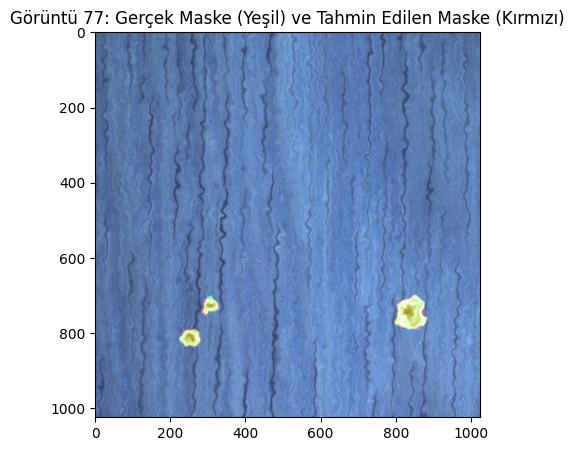

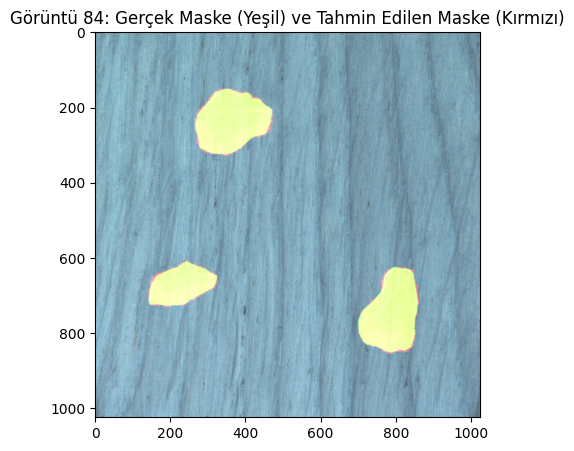

Rastgele seçilen 20 görüntü output_anomaly-images klasörüne kaydedildi.


In [98]:
import os
import random
import cv2
import numpy as np
from skimage import io
import matplotlib.pyplot as plt

# Klasörü oluştur
outputfolder = "output_anomaly-images"
os.makedirs(outputfolder, exist_ok=True)

# Veri kümenizden rastgele 10 örneği seçin
random_indices = random.sample(range(len(df_pred)), min(20, len(df_pred)))

# Seçilen 10 örneği işleyin
for i in random_indices:
    if df_pred['has_mask'][i] == 1:
        # Giriş görüntüsünü alın
        input_image = io.imread(df_pred.image_path[i])
        input_image = cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB)

        # Tahmin edilen maskeyi alın
        predicted_mask = np.asarray(df_pred.predicted_mask[i])[0].squeeze().round()

        # Gerçek maskeyi alın
        real_mask = io.imread(df_pred.mask_path[i])

        # Giriş görüntüsü ve tahmin edilen maske arasında boyutları eşitleme
        input_image = cv2.resize(input_image, (real_mask.shape[1], real_mask.shape[0]))
        predicted_mask = cv2.resize(predicted_mask, (real_mask.shape[1], real_mask.shape[0]))

        # Renklendirilmiş tahmin edilen maskeyi oluşturun (kırmızı)
        predicted_mask_colored = np.zeros_like(input_image)
        predicted_mask_colored[:, :, 0] = predicted_mask * 255  # Tahmin edilen maskeyi kırmızı ile göster

        # Gerçek maskeyi renklendirin (yeşil)
        real_mask_colored = np.zeros_like(input_image)
        real_mask_colored[real_mask == 255] = [0, 255, 0]  # Gerçek maskeyi yeşil ile göster

        # Giriş görüntüsü ile maskeleri üst üste getirme
        overlay = cv2.addWeighted(input_image, 1, real_mask_colored, 0.5, 0)
        overlay = cv2.addWeighted(overlay, 1, predicted_mask_colored, 0.5, 0)

        # Görselleştirme
        plt.figure(figsize=(10, 5))

        # Orijinal giriş görüntüsü, gerçek maske ve tahmin edilen maske üst üste
        plt.imshow(overlay)
        plt.title(f"Görüntü {i+1}: Gerçek Maske (Yeşil) ve Tahmin Edilen Maske (Kırmızı)")

        # Dosya adı ve yolunu oluştur
        output_file_path = os.path.join(output_folder, f'output_image_{i+1}.png')

        # Her bir görüntüyü dosyaya kaydetme
        plt.savefig(output_file_path)

        # Görseli ekranda gösterme
        plt.show()

print(f"Rastgele seçilen 20 görüntü {outputfolder} klasörüne kaydedildi.")